# Import of libraries (Google Earth Engine)

In [1]:
# pip install earthengine-api geemap

import ee
import geemap
ee.Authenticate()
ee.Initialize(project='festive-oxide-485716-b0')
print("Earth Engine test :", ee.String("OK").getInfo())

Earth Engine test : OK


In [2]:
import os

# Central output directory shared by every figure and table produced in this notebook.
# Resolves to Appendix/outputs (one level up from Appendix/notebooks) — the folder the
# notebook already exports into further down, so every export in this notebook lands here.
OUT_DIR = os.path.abspath(os.path.join(os.getcwd(), '..', 'outputs'))
os.makedirs(OUT_DIR, exist_ok=True)

def save_figure(fig, filename, dpi=300):
    """Save a matplotlib figure to OUT_DIR as a PNG."""
    path = os.path.join(OUT_DIR, filename)
    fig.savefig(path, dpi=dpi, bbox_inches='tight')
    print(f"[export] Figure -> {path}")
    return path

def save_table(df, filename, index=True):
    """Save a DataFrame to OUT_DIR as a CSV."""
    path = os.path.join(OUT_DIR, filename)
    df.to_csv(path, index=index)
    print(f"[export] Table  -> {path}")
    return path

print(f"All figures and tables produced by this notebook will be exported to: {OUT_DIR}")

All figures and tables produced by this notebook will be exported to: /Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs


# Floods in Nigeria (October 2022) with Sentinel-2 and Sentinel-1 and Google Earth Engine

In [3]:
# Create the map centered on Lokoja, Nigeria
Map = geemap.Map(center=[7.80, 6.73], zoom=9)

# Center point (Lokoja, Nigeria)
center_point = ee.Geometry.Point([6.73, 7.80])

# .buffer creates a circle, .bounds() converts it to a square bounding box
roi = center_point.buffer(50000).bounds()

roi = ee.Geometry.Rectangle([6.3, 7.4, 7.1, 8.2])

## Define the study area and dates

We will focus on a 50km buffer zone around Lokoja and define two periods: before the floods (August) and during the peak of the floods (late September/October).

In [4]:
# Define the time periods
pre_flood_start = '2022-07-01'
pre_flood_end = '2022-08-31'

flood_start = '2022-09-25'
flood_end = '2022-10-31'

## Filter the Sentinel-2 image collection

Sentinel-2 provides high-resolution (10m) multispectral imagery. We will retrieve the least cloudy images for our two periods and calculate the median value to obtain clear, cloud-free composites.

In [5]:
# Updated Step 3: Relax cloud filter and use cloud masking
# Load the Sentinel-2 Surface Reflectance Harmonized collection
s2_collection = ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED").filterBounds(roi)
cs_plus = ee.ImageCollection("GOOGLE/CLOUD_SCORE_PLUS/V1/S2_HARMONIZED").filterBounds(roi)

# Function to mask clouds using the Scene Classification (SCL) band
def mask_s2_clouds(image):
    scl = image.select('SCL')
    # SCL values: 3 (Cloud shadows), 8 (Cloud medium prob), 9 (Cloud high prob), 10 (Cirrus)
    # We want to KEEP pixels that are NOT these values.
    mask = scl.neq(3).And(scl.neq(8)).And(scl.neq(9)).And(scl.neq(10))
    return image.updateMask(mask)

# Link the two collections (adds the 'cs_cdf' clear-pixel probability band to S2)
s2_linked = s2_collection.linkCollection(cs_plus, ['cs_cdf'])

# Function to mask clouds using CS+
def mask_clouds_csplus(image):
    # cs_cdf ranges from 0 (certain cloud/shadow) to 1 (certain clear pixel)
    # A threshold of 0.60 to 0.65 is ideal for keeping only clear pixels
    clear_pixel_mask = image.select('cs_cdf').gte(0.6)
    return image.updateMask(clear_pixel_mask)

# Create the cloud-free mosaics (Pre-flood and Flood)
pre_flood_img = s2_linked \
    .filterDate(pre_flood_start, pre_flood_end) \
    .map(mask_clouds_csplus) \
    .median() \
    .clip(roi)

flood_img = s2_linked \
    .filterDate(flood_start, flood_end) \
    .map(mask_clouds_csplus) \
    .median() \
    .clip(roi)

## Calculate the Water Index (NDWI)

The NDWI (Normalized Difference Water Index) is ideal for detecting water. It relies on the green band (B3) and the near-infrared band (B8). The formula is: $$(Green - NIR) / (Green + NIR)$$.

In [6]:
# Calculate NDWI for both periods
ndwi_pre = pre_flood_img.normalizedDifference(['B3', 'B8']).rename('NDWI')
ndwi_flood = flood_img.normalizedDifference(['B3', 'B8']).rename('NDWI')

Generally, NDWI values greater than 0 (or a threshold like 0.1 depending on the noise level) indicate the presence of water. We will extract all water bodies, then subtract the "normal" permanent water to isolate the flooded areas.

In [7]:
# Threshold to classify pixels as "water"
water_threshold = 0.0

# Water masks (1 = water, 0 = no water)
water_pre = ndwi_pre.gt(water_threshold)
water_flood = ndwi_flood.gt(water_threshold)

# Flooded areas: Water during the flood AND NO water beforehand
# We subtract the pre-flood image. If the result is positive, it's a newly flooded area.
flooded_area = water_flood.subtract(water_pre).gt(0)

# True-color visualization parameters (Red, Green, Blue)
vis_params = {'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 3000}

# Add the base satellite images
Map.addLayer(pre_flood_img, vis_params, 'Pre-Flood (True Color)', False)
Map.addLayer(flood_img, vis_params, 'During Flood (True Color)', False)

# Add permanent water (in blue)
# selfMask() makes the "0" pixels transparent
Map.addLayer(water_pre.selfMask(), {'palette': ['blue']}, 'Permanent Water (Pre-flood)')

# Add the flooded area (in red)
Map.addLayer(flooded_area.selfMask(), {'palette': ['red']}, 'Flooded Areas (Oct 2022)')

In [8]:
# Calculate MNDWI (Green - SWIR) / (Green + SWIR)
mndwi_pre = pre_flood_img.normalizedDifference(['B3', 'B11']).rename('MNDWI')
mndwi_flood = flood_img.normalizedDifference(['B3', 'B11']).rename('MNDWI')

# Water masks using MNDWI (Threshold is typically 0)
water_pre_mndwi = mndwi_pre.gt(0)
water_flood_mndwi = mndwi_flood.gt(0)

# Extract newly flooded areas
flooded_area_mndwi = water_flood_mndwi.subtract(water_pre_mndwi).gt(0)

# Visualize MNDWI results
Map.addLayer(flooded_area_mndwi.selfMask(), {'palette': ['cyan']}, 'MNDWI Flooded Areas (S2)', False)

In [9]:
# Display the updated map
Map

Map(center=[7.8, 6.73], controls=(WidgetControl(options=['position', 'transparent_bg'], position='topright', t…

## Sentinel-1 (SAR) Flood Mapping

We will use Sentinel-1 Ground Range Detected (GRD) data. We filter for Interferometric Wide (IW) swath mode and the VH (Vertical transmit, Horizontal receive) polarization, which is highly effective for detecting water.

In [10]:
# Load Sentinel-1 GRD collection
s1_collection = ee.ImageCollection('COPERNICUS/S1_GRD') \
    .filterBounds(roi) \
    .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VH')) \
    .filter(ee.Filter.eq('instrumentMode', 'IW')) \
    .select('VH')

In [11]:
# Pre-flood SAR image with 50m smoothing to reduce speckle
s1_pre_flood = s1_collection \
    .filterDate(pre_flood_start, pre_flood_end) \
    .median() \
    .focal_median(50, 'circle', 'meters') \
    .clip(roi)

# Flood SAR image
s1_flood = s1_collection \
    .filterDate(flood_start, flood_end) \
    .median() \
    .focal_median(50, 'circle', 'meters') \
    .clip(roi)

In [12]:
# SAR water threshold in dB
s1_water_threshold = -19

# Identify water bodies (values LESS than the threshold)
s1_water_pre = s1_pre_flood.lt(s1_water_threshold)
s1_water_flood = s1_flood.lt(s1_water_threshold)

# Isolate newly flooded areas by subtracting pre-flood water
s1_flooded_area = s1_water_flood.subtract(s1_water_pre).gt(0)

In [13]:
# Add raw radar images (Darker areas = smoother surfaces/water)
Map.addLayer(s1_pre_flood, {'min': -25, 'max': 0}, 'S1 Pre-Flood (VH)', False)
Map.addLayer(s1_flood, {'min': -25, 'max': 0}, 'S1 Flood (VH)', False)

# Add permanent water from SAR in dark blue
Map.addLayer(s1_water_pre.selfMask(), {'palette': ['darkblue']}, 'S1 Permanent Water')

# Add SAR flooded area in orange to contrast with optical results
Map.addLayer(s1_flooded_area.selfMask(), {'palette': ['orange']}, 'S1 Flooded Areas (Oct 2022)')

Map

Map(center=[7.8, 6.73], controls=(WidgetControl(options=['position', 'transparent_bg'], position='topright', t…

In [14]:
# Function to calculate area in Hectares for any binary mask
def get_area_ha(mask_image, region, scale=30):
    area_img = mask_image.multiply(ee.Image.pixelArea())
    stats = area_img.reduceRegion(
        reducer=ee.Reducer.sum(),
        geometry=region,
        scale=scale,
        maxPixels=1e10
    )
    # Extract the sum value
    band_name = mask_image.bandNames().get(0)
    area_sq_m = stats.getNumber(band_name)
    area_ha = area_sq_m.divide(10000)
    return area_ha.getInfo()

# --- Sentinel-2 Calculations ---
s2_pre_ha = get_area_ha(water_pre, roi)
s2_during_ha = get_area_ha(water_flood, roi)
s2_flooded_ha = get_area_ha(flooded_area, roi)

# --- Sentinel-1 Calculations ---
s1_pre_ha = get_area_ha(s1_water_pre, roi)
s1_during_ha = get_area_ha(s1_water_flood, roi)
s1_flooded_ha = get_area_ha(s1_flooded_area, roi)

# Display tabular comparison
import pandas as pd

comparison_df = pd.DataFrame({
    'Metric (Hectares)': [
        'Pre-Flood Water (August)',
        'During-Flood Water (Oct)',
        'Newly Flooded Area (Net)'
    ],
    'Sentinel-2 (MNDWI Optical)': [
        f"{s2_pre_ha:,.2f} ha",
        f"{s2_during_ha:,.2f} ha",
        f"{s2_flooded_ha:,.2f} ha"
    ],
    'Sentinel-1 (SAR Radar)': [
        f"{s1_pre_ha:,.2f} ha",
        f"{s1_during_ha:,.2f} ha",
        f"{s1_flooded_ha:,.2f} ha"
    ]
})

print("=== FLOOD EXTENT COMPARISON SUMMARY ===")
display(comparison_df)
save_table(comparison_df, 'Flood_Extent_Comparison_Ha.csv', index=False)

=== FLOOD EXTENT COMPARISON SUMMARY ===


,Metric (Hectares),Sentinel-2 (MNDWI Optical),Sentinel-1 (SAR Radar)
0,Pre-Flood Water (August),"6,438.57 ha","21,346.38 ha"
1,During-Flood Water (Oct),"60,085.71 ha","58,841.53 ha"
2,Newly Flooded Area (Net),"53,650.96 ha","38,411.59 ha"


[export] Table  -> /Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/Flood_Extent_Comparison_Ha.csv


'/Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/Flood_Extent_Comparison_Ha.csv'

Fetching images from Google Earth Engine... (This may take a minute)


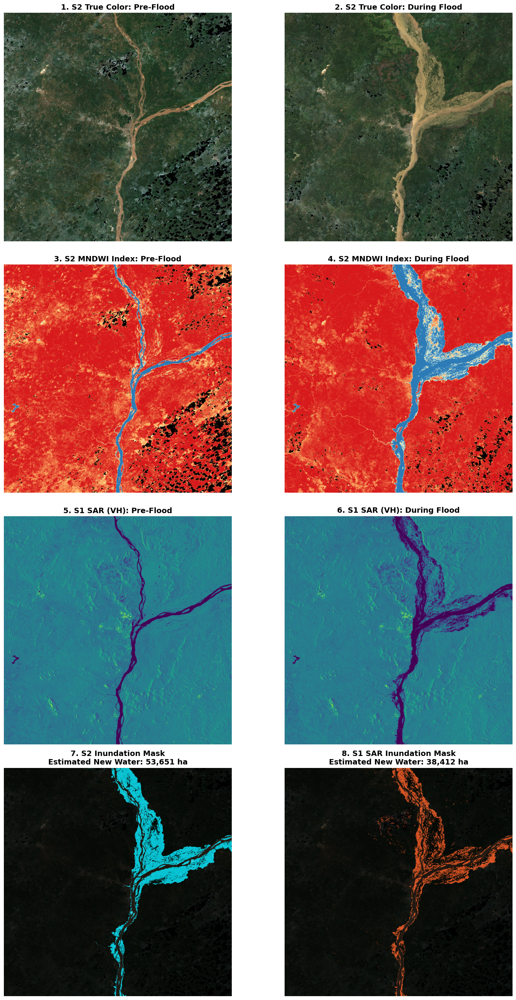

[export] Figure -> /Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/Flood_Comparison_Summary_Lokoja.png


'/Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/Flood_Comparison_Summary_Lokoja.png'

In [15]:
import matplotlib.pyplot as plt
import geemap
import os

print("Fetching images from Google Earth Engine... (This may take a minute)")

# --- 1. Define Visualizations ---

# RGB Composites (Sentinel-2)
s2_rgb_pre = pre_flood_img.visualize(bands=['B4', 'B3', 'B2'], min=0, max=3000)
s2_rgb_flood = flood_img.visualize(bands=['B4', 'B3', 'B2'], min=0, max=3000)

# MNDWI Index (Sentinel-2)
mndwi_palette = ['#d7191c', '#fdae61', '#ffffbf', '#abd9e9', '#2c7bb6']
s2_mndwi_pre = mndwi_pre.visualize(palette=mndwi_palette, min=-0.5, max=0.5)
s2_mndwi_flood = mndwi_flood.visualize(palette=mndwi_palette, min=-0.5, max=0.5)

# SAR Backscatter (Sentinel-1 VH Polarization)
s1_vis_pre = s1_pre_flood.visualize(min=-25, max=0)
s1_vis_flood = s1_flood.visualize(min=-25, max=0)

# Final Inundation Masks
s2_flood_mask_vis = flooded_area_mndwi.selfMask().visualize(palette=['#00e5ff']) # Cyan
s1_flood_mask_vis = s1_flooded_area.selfMask().visualize(palette=['#ff5722'])    # Orange

# --- 2. Fetch Numpy Arrays ---
scale = 100

arr_s2_pre       = geemap.ee_to_numpy(s2_rgb_pre, region=roi, scale=scale)
arr_s2_flood     = geemap.ee_to_numpy(s2_rgb_flood, region=roi, scale=scale)
arr_mndwi_pre    = geemap.ee_to_numpy(s2_mndwi_pre, region=roi, scale=scale)
arr_mndwi_flood  = geemap.ee_to_numpy(s2_mndwi_flood, region=roi, scale=scale)
arr_s1_pre       = geemap.ee_to_numpy(s1_vis_pre, region=roi, scale=scale)
arr_s1_flood     = geemap.ee_to_numpy(s1_vis_flood, region=roi, scale=scale)
arr_s2_mask      = geemap.ee_to_numpy(s2_flood_mask_vis, region=roi, scale=scale)
arr_s1_mask      = geemap.ee_to_numpy(s1_flood_mask_vis, region=roi, scale=scale)

# --- 3. Create the 4x2 Subplot Figure ---
fig, axs = plt.subplots(4, 2, figsize=(16, 26))

# ROW 1: Sentinel-2 True Color
axs[0, 0].imshow(arr_s2_pre)
axs[0, 0].set_title("1. S2 True Color: Pre-Flood", fontsize=14, fontweight='bold')
axs[0, 0].axis('off')

axs[0, 1].imshow(arr_s2_flood)
axs[0, 1].set_title("2. S2 True Color: During Flood", fontsize=14, fontweight='bold')
axs[0, 1].axis('off')

# ROW 2: Sentinel-2 MNDWI
axs[1, 0].imshow(arr_mndwi_pre)
axs[1, 0].set_title("3. S2 MNDWI Index: Pre-Flood", fontsize=14, fontweight='bold')
axs[1, 0].axis('off')

axs[1, 1].imshow(arr_mndwi_flood)
axs[1, 1].set_title("4. S2 MNDWI Index: During Flood", fontsize=14, fontweight='bold')
axs[1, 1].axis('off')

# ROW 3: Sentinel-1 SAR (Grayscale)
axs[2, 0].imshow(arr_s1_pre)
axs[2, 0].set_title("5. S1 SAR (VH): Pre-Flood", fontsize=14, fontweight='bold')
axs[2, 0].axis('off')

axs[2, 1].imshow(arr_s1_flood)
axs[2, 1].set_title("6. S1 SAR (VH): During Flood", fontsize=14, fontweight='bold')
axs[2, 1].axis('off')

# ROW 4: Final Inundation Maps
axs[3, 0].imshow(arr_s2_pre)
axs[3, 0].imshow(arr_s2_mask, alpha=0.8)
axs[3, 0].set_title(f"7. S2 Inundation Mask\nEstimated New Water: {s2_flooded_ha:,.0f} ha", fontsize=14, fontweight='bold')
axs[3, 0].axis('off')

axs[3, 1].imshow(arr_s2_pre)
axs[3, 1].imshow(arr_s1_mask, alpha=0.8)
axs[3, 1].set_title(f"8. S1 SAR Inundation Mask\nEstimated New Water: {s1_flooded_ha:,.0f} ha", fontsize=14, fontweight='bold')
axs[3, 1].axis('off')

plt.tight_layout()
plt.show()

save_figure(fig, 'Flood_Comparison_Summary_Lokoja.png')

In [16]:
import os

# Raster mask exports (GeoTIFF) — not figures/tables, but kept alongside the other
# outputs in the same shared OUT_DIR defined earlier in the notebook.
s2_tif = os.path.join(OUT_DIR, 'Sentinel2_FloodMask_Lokoja.tif')
s1_tif = os.path.join(OUT_DIR, 'Sentinel1_FloodMask_Lokoja.tif')

def export_geotiff(image, filename, region, scale=30, attempts=2):
    """Export an EE image to a local GeoTIFF, retrying once on the flaky
    Earth Engine thumbnail-download errors, and only reporting success once
    the file is actually confirmed on disk."""
    for attempt in range(1, attempts + 1):
        try:
            geemap.ee_export_image(
                image,
                filename=filename,
                scale=scale,
                region=region,
                file_per_band=False
            )
        except Exception as exc:
            print(f"  Attempt {attempt}/{attempts} raised an exception: {exc}")
            continue
        if os.path.exists(filename) and os.path.getsize(filename) > 0:
            print(f"  Confirmed on disk: {filename}")
            return True
        print(f"  Attempt {attempt}/{attempts} did not produce a file.")
    print(f"  FAILED to export {filename} after {attempts} attempt(s).")
    return False

print("Exporting Sentinel-2 GeoTIFF...")
# scale=30 makes Earth Engine's synchronous getPixels endpoint exceed its
# "User memory limit" computing the cloud-masked median composite behind
# flooded_area_mndwi (confirmed by testing directly against the download API:
# scale=30 -> HTTP 400 "User memory limit exceeded"; scale=50 -> HTTP 200 OK).
# Sentinel-1 has a lighter compute graph and exports fine at native scale=30.
s2_ok = export_geotiff(flooded_area_mndwi, s2_tif, roi, scale=50)

print("Exporting Sentinel-1 GeoTIFF...")
s1_ok = export_geotiff(s1_flooded_area, s1_tif, roi)

if s2_ok and s1_ok:
    print("All GeoTIFF exports completed successfully!")
else:
    print("Some GeoTIFF exports failed — see messages above "
          "(Earth Engine thumbnail downloads are occasionally flaky; "
          "re-running this cell alone usually fixes it).")

Exporting Sentinel-2 GeoTIFF...
Generating URL ...


Please wait ...


Data downloaded to /Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/Sentinel2_FloodMask_Lokoja.tif
  Confirmed on disk: /Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/Sentinel2_FloodMask_Lokoja.tif
Exporting Sentinel-1 GeoTIFF...
Generating URL ...


Please wait ...


Data downloaded to /Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/Sentinel1_FloodMask_Lokoja.tif
  Confirmed on disk: /Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/Sentinel1_FloodMask_Lokoja.tif
All GeoTIFF exports completed successfully!


# Methodology: Empirical Measurement of Sentinel-2 Optical Observability
 
*Reproducible methodological chain (Sentinel-1/Sentinel-2, Google Earth Engine)*
 
Before attempting any natural hazard detection using optical remote sensing, it is necessary to quantify the probability of obtaining an exploitable observation within a useful time window following an event. This step is not treated here as a side constraint to be bypassed by assumption, but as a subject of measurement in its own right: cloud cover becomes the empirically characterized variable rather than the assumed obstacle. This choice directly determines the feasibility of subsequent detection analyses and provides a quantitative criterion—rather than a mere assertion—to justify the use of a radar sensor (Sentinel-1) alongside optical sensors (Sentinel-2).
 
## 1. Conceptual Framework and Definitions
 
Three metrics, frequently confused, are distinguished from the outset:
 
| Metric | Definition | Scope |
|---|---|---|
| Revisit frequency | Number of satellite passes over a given point | Orbital property, independent of atmospheric conditions |
| Image availability | Number of actually archived acquisitions | Depends on the orbit and programmed acquisition plan |
| Observability | Probability of obtaining at least one clear pixel at a given point and time window | The only relevant metric for operational feasibility |
 
Only observability is retained as the metric of interest. It is a spatio-temporal field, varying by pixel, calendar month, and window duration, formally defined by:
 
$$O(x, m, \Delta) = P\big(\exists\, t \in [t_0, t_0+\Delta] : \text{pixel } x \text{ clear at } t\big), \quad t_0 \in \text{month } m$$
 
The following sections detail the empirical estimation of this metric: first in its aggregated climatological form (§3), then in its operational form—the probability of observation in the days following an event (§4).

## 2. Study Area and Satellite Data
 
All processing is implemented on the Google Earth Engine cloud platform via its Python API, with aggregated results brought back locally for analysis and visualization (pandas, NumPy, Matplotlib).
 
**Study Area.** The processing is developed and validated on the previously defined Region of Interest (ROI) centered around Lokoja, Nigeria.
 
**Optical Imagery.** Harmonized Sentinel-2 surface reflectance is used starting from January 1, 2019. Only the pixel quality score is used at this stage to limit computational costs.
 
**Pixel-wise Clarity Classification.** A pixel is classified as clear when `cs_cdf >= 0.60` using the Cloud Score+ product. The result of this thresholding is a binary collection (1 = clear, 0 = masked).

In [17]:
import ee
import geemap
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime

# --- Section 2: Study Area and Satellite Data ---

# We reuse the 'roi' variable (Lokoja bounding box) defined in the first part of the notebook.

# Timeframe: Jan 1, 2019 to Current Date
start_date = '2019-01-01'
end_date = datetime.now().strftime('%Y-%m-%d')

# Load Sentinel-2 and Cloud Score+ without spectral bands to save EECU
s2_col = ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED") \
    .filterBounds(roi) \
    .filterDate(start_date, end_date)

cs_plus = ee.ImageCollection("GOOGLE/CLOUD_SCORE_PLUS/V1/S2_HARMONIZED") \
    .filterBounds(roi) \
    .filterDate(start_date, end_date)

# Link the Cloud Score+ CDF band to Sentinel-2
s2_linked = s2_col.linkCollection(cs_plus, ['cs_cdf'])

# Binary Classification (cs_cdf >= 0.60)
def create_binary_clear_mask(img):
    # 1 = clear, 0 = masked
    is_clear = img.select('cs_cdf').gte(0.60).rename('is_clear')
    return is_clear.copyProperties(img, ['system:time_start'])

s2_binary = s2_linked.map(create_binary_clear_mask)

## 3. Monthly Climatology of Observability
 
For each calendar month, the average fraction of clear acquisitions is calculated pixel by pixel over the entire archive, along with the number of acquisitions that contributed to this average. Letting $c_i(x)\in\{0,1\}$ be the clarity indicator of acquisition $i$ at pixel $x$, the climatological estimator is written as:
 
$$\hat c(x,m) = \frac{1}{N_m(x)}\sum_{i \in \mathcal I_m(x)} c_i(x), \qquad N_m(x) = |\mathcal I_m(x)|$$
 
The chosen strategy breaks down the calculation into twelve independent spatial reduction calls, one per month, to avoid exceeding the memory limit of the Earth Engine expression graph. The spatial reduction is performed at a computing resolution of 100 m.

Reducing monthly climatology over the ROI for all 12 months...



--- Monthly Climatology of Sentinel-2 Clear-Sky Observability (ROI mean) ---


,clear_fraction,month,obs_count
0,0.874,1,86.470
1,0.759,2,77.601
2,0.538,3,87.723
3,0.463,4,91.440
4,0.451,5,94.471
5,0.202,6,91.440
6,0.186,7,98.292
7,0.137,8,88.681
8,0.179,9,74.698
9,0.356,10,76.273


[export] Table  -> /Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/Monthly_Climatology_Clear_Fraction.csv


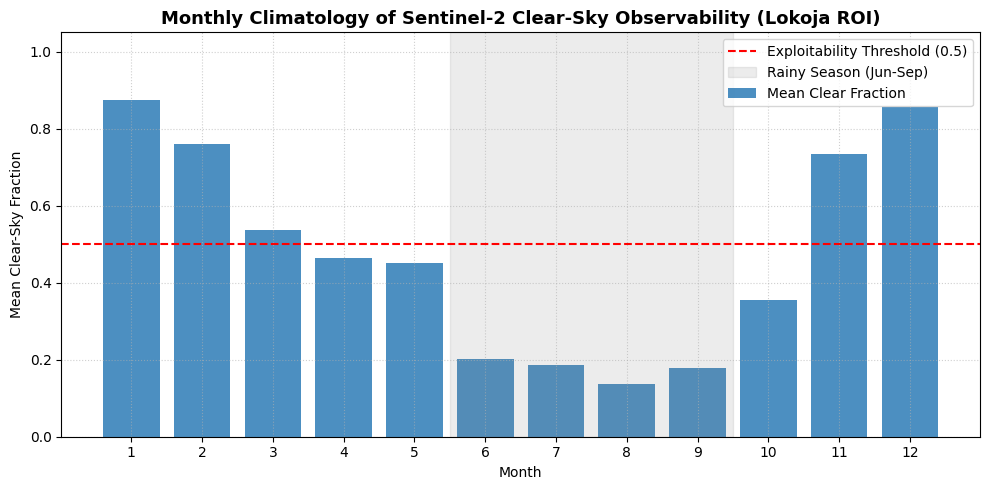

[export] Figure -> /Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/Monthly_Climatology_Observability.png


'/Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/Monthly_Climatology_Observability.png'

In [18]:
# --- Section 3: Monthly Climatology of Observability ---

def compute_monthly_climatology(month):
    monthly_col = s2_binary.filter(ee.Filter.calendarRange(month, month, 'month'))
    clear_fraction = monthly_col.mean().rename('clear_fraction')
    obs_count = monthly_col.count().rename('obs_count')
    return ee.Image.cat([clear_fraction, obs_count]).set('month', month)

climatology_list = []
for m in range(1, 13):
    climatology_list.append(compute_monthly_climatology(m))

climatology_col = ee.ImageCollection.fromImages(climatology_list)

august_clim = climatology_col.filter(ee.Filter.eq('month', 8)).first()

Map_Clim = geemap.Map(center=[7.80, 6.73], zoom=9)
Map_Clim.addLayer(roi, {'color': 'red'}, 'Lokoja AOI', False, 0.5)
Map_Clim.addLayer(august_clim.select('clear_fraction'), {'min': 0, 'max': 1, 'palette': ['red', 'yellow', 'green']}, 'August Clear Fraction')
# Map_Clim

# --- Spatial aggregation over the ROI for all 12 months ---
# (the per-pixel climatology above is useful for mapping one month; to actually
# analyze and export the index we reduce every month over the ROI into one table/figure)
print("Reducing monthly climatology over the ROI for all 12 months...")

def reduce_climatology(img):
    stats = img.reduceRegion(
        reducer=ee.Reducer.mean(),
        geometry=roi,
        scale=100,
        maxPixels=1e9
    )
    return ee.Feature(None, {
        'month': img.get('month'),
        'clear_fraction': stats.get('clear_fraction'),
        'obs_count': stats.get('obs_count')
    })

climatology_features = climatology_col.map(reduce_climatology).getInfo()['features']
climatology_df = pd.DataFrame([f['properties'] for f in climatology_features]).sort_values('month').reset_index(drop=True)
climatology_df = climatology_df.round(3)

print("\n--- Monthly Climatology of Sentinel-2 Clear-Sky Observability (ROI mean) ---")
display(climatology_df)
save_table(climatology_df, 'Monthly_Climatology_Clear_Fraction.csv', index=False)

fig_clim, ax_clim = plt.subplots(figsize=(10, 5))
ax_clim.bar(climatology_df['month'], climatology_df['clear_fraction'], color='#2c7bb6', alpha=0.85, label='Mean Clear Fraction')
ax_clim.axhline(y=0.5, color='red', linestyle='--', label='Exploitability Threshold (0.5)')
ax_clim.axvspan(5.5, 9.5, color='gray', alpha=0.15, label='Rainy Season (Jun-Sep)')
ax_clim.set_title('Monthly Climatology of Sentinel-2 Clear-Sky Observability (Lokoja ROI)', fontsize=13, fontweight='bold')
ax_clim.set_xlabel('Month')
ax_clim.set_ylabel('Mean Clear-Sky Fraction')
ax_clim.set_xticks(range(1, 13))
ax_clim.set_ylim(0, 1.05)
ax_clim.legend(loc='upper right')
ax_clim.grid(True, linestyle=':', alpha=0.6)
plt.tight_layout()
plt.show()

save_figure(fig_clim, 'Monthly_Climatology_Observability.png')

## 4. Empirical Probability of Post-Event Observation
 
If an event occurs on a given date, what is the probability of obtaining at least one exploitable observation in the following $\Delta$ days? This probability is estimated by empirical resampling on the actual archive rather than by a parametric probabilistic model (e.g., independent binomial) to respect the temporal autocorrelation of cloud cover.
 
The procedure involves four steps:
1. Calculation of the clear pixel fraction over the ROI for each acquisition, retrieved as (date, fraction).
2. Explicit exclusion of acquisitions where the fraction is undefined (swath tangency).
3. Thresholding: an acquisition is considered exploitable if its clear fraction reaches at least 0.5.
4. Testing windows $\Delta \in \{3, 7, 15, 30\}$ days.

The empirical estimator of the post-event observation probability for month $m$ is written as:
 
$$\hat P(\Delta \mid m) = \frac{1}{|J_m|} \sum_{j \in J_m} \mathbb{1}\!\left[\exists\, d \in D_{\text{exploitable}} : j \le d \le j+\Delta\right]$$

In [19]:
# --- Section 4: Empirical Post-Event Observation Probability ---

print("Fetching spatial reductions... (This may take a few minutes for the archive)")

def compute_aoi_fraction(img):
    stats = img.reduceRegion(
        reducer=ee.Reducer.mean(),
        geometry=roi,
        scale=100,
        maxPixels=1e9
    )
    return ee.Feature(None, {
        'date': img.date().format('YYYY-MM-dd'),
        'clear_fraction': stats.get('is_clear')
    })

s2_stats_features = s2_binary.map(compute_aoi_fraction).getInfo()['features']

records = []
for feat in s2_stats_features:
    props = feat['properties']
    if props.get('clear_fraction') is not None:
        records.append({
            'date': pd.to_datetime(props['date']),
            'clear_fraction': props['clear_fraction']
        })

df_s2 = pd.DataFrame(records).sort_values('date').reset_index(drop=True)
df_s2['month'] = df_s2['date'].dt.month

# Exploitability Threshold
df_s2['is_exploitable'] = df_s2['clear_fraction'] >= 0.5
exploitable_dates = df_s2[df_s2['is_exploitable']]['date'].values

# Delta Windows
deltas = [3, 7, 15, 30]
date_range = pd.date_range(start=df_s2['date'].min(), end=df_s2['date'].max())
df_candidates = pd.DataFrame({'date': date_range})
df_candidates['month'] = df_candidates['date'].dt.month

for delta in deltas:
    col_name = f'P_{delta}d'
    df_candidates[col_name] = False
    
    for idx, row in df_candidates.iterrows():
        j = row['date']
        j_plus_delta = j + pd.Timedelta(days=delta)
        has_obs = np.any((exploitable_dates >= j) & (exploitable_dates <= j_plus_delta))
        df_candidates.at[idx, col_name] = has_obs

monthly_probs = df_candidates.groupby('month')[[f'P_{d}d' for d in deltas]].mean().round(3)

print("\n--- Monthly Probability of an Exploitable Observation within Delta Days ---")
display(monthly_probs)
save_table(monthly_probs, 'Monthly_Exploitable_Observation_Probability.csv', index=True)

Fetching spatial reductions... (This may take a few minutes for the archive)



--- Monthly Probability of an Exploitable Observation within Delta Days ---


,P_3d,P_7d,P_15d,P_30d
month,,,,
1,0.752,0.967,1.000,1.000
2,0.664,0.938,1.000,1.000
3,0.613,0.879,0.984,1.000
4,0.496,0.775,0.983,1.000
5,0.532,0.782,0.915,0.984
6,0.221,0.371,0.612,0.942
7,0.141,0.254,0.472,0.726
8,0.120,0.245,0.402,0.676
9,0.129,0.281,0.543,0.881


[export] Table  -> /Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/Monthly_Exploitable_Observation_Probability.csv


'/Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/Monthly_Exploitable_Observation_Probability.csv'

## 5. Testing Hypothesis H1 and Sentinel-1 Complementarity
 
**Testing Hypothesis H1.** The median of $\hat P(\Delta=15\text{ d} \mid m)$ over the rainy season months (June to September) is compared to the 0.5 threshold. A median below 0.5 disqualifies optical imagery alone and empirically justifies the use of SAR.
 
**Sentinel-1 Complementarity.** The monthly number of Sentinel-1 acquisitions (all weather, IW mode) is compared to the monthly number of exploitable Sentinel-2 acquisitions. The empirical demonstration of this temporal coincidence justifies the bi-sensor architecture.

Fetching Sentinel-1 metadata...


H1 Testing (Delta = 15d): Median probability during rainy season = 0.51
H1 Status: Optical is SUFFICIENT. H1 Refuted.


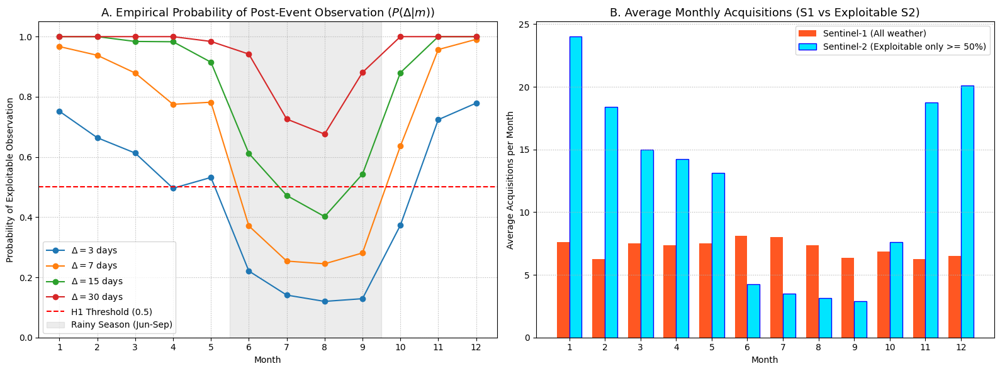

[export] Figure -> /Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/H1_Observation_Probability_And_S1_Complementarity.png


'/Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/H1_Observation_Probability_And_S1_Complementarity.png'

In [20]:
# --- Section 5: Testing H1 and Sentinel-1 Complementarity ---

print("Fetching Sentinel-1 metadata...")
s1_col = ee.ImageCollection("COPERNICUS/S1_GRD") \
    .filterBounds(roi) \
    .filterDate(start_date, end_date) \
    .filter(ee.Filter.eq('instrumentMode', 'IW'))

def extract_s1_dates(img):
    return ee.Feature(None, {'date': img.date().format('YYYY-MM-dd')})

s1_features = s1_col.map(extract_s1_dates).getInfo()['features']
s1_dates = [pd.to_datetime(f['properties']['date']) for f in s1_features]

df_s1 = pd.DataFrame({'date': s1_dates})
df_s1['month'] = df_s1['date'].dt.month

years_span = df_s2['date'].dt.year.max() - df_s2['date'].dt.year.min() + 1
s1_monthly_counts = df_s1.groupby('month').size() / years_span
s2_exploitable_counts = df_s2[df_s2['is_exploitable']].groupby('month').size() / years_span

# Hypothesis Test
rainy_season = [6, 7, 8, 9] 
median_p15_rainy = monthly_probs.loc[rainy_season, 'P_15d'].median()
h1_verified = median_p15_rainy < 0.5

print(f"H1 Testing (Delta = 15d): Median probability during rainy season = {median_p15_rainy:.2f}")
print(f"H1 Status: {'Optical is INSUFFICIENT (<0.5). SAR justified.' if h1_verified else 'Optical is SUFFICIENT. H1 Refuted.'}")

# Visualization
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

for delta in deltas:
    axs[0].plot(monthly_probs.index, monthly_probs[f'P_{delta}d'], marker='o', label=f'$\Delta = {delta}$ days')

axs[0].axhline(y=0.5, color='red', linestyle='--', label='H1 Threshold (0.5)')
axs[0].axvspan(5.5, 9.5, color='gray', alpha=0.15, label='Rainy Season (Jun-Sep)')
axs[0].set_title("A. Empirical Probability of Post-Event Observation ($P(\Delta|m)$)", fontsize=13)
axs[0].set_xlabel("Month")
axs[0].set_ylabel("Probability of Exploitable Observation")
axs[0].set_xticks(range(1, 13))
axs[0].set_ylim(0, 1.05)
axs[0].legend(loc='lower left')
axs[0].grid(True, linestyle=':')

width = 0.35
axs[1].bar(s1_monthly_counts.index - width/2, s1_monthly_counts.values, width, 
           label='Sentinel-1 (All weather)', color='#ff5722')
axs[1].bar(s2_exploitable_counts.index + width/2, s2_exploitable_counts.values, width, 
           label='Sentinel-2 (Exploitable only >= 50%)', color='#00e5ff', edgecolor='blue')

axs[1].set_title("B. Average Monthly Acquisitions (S1 vs Exploitable S2)", fontsize=13)
axs[1].set_xlabel("Month")
axs[1].set_ylabel("Average Acquisitions per Month")
axs[1].set_xticks(range(1, 13))
axs[1].legend()
axs[1].grid(True, linestyle=':', axis='y')

plt.tight_layout()
plt.show()

save_figure(fig, 'H1_Observation_Probability_And_S1_Complementarity.png')

## 6. Statistical Analysis of the Flood Anomaly
 
Visual interpretation and areal calculations are essential, but remote sensing anomalies should also be validated statistically. An extreme flood event fundamentally alters the statistical distribution of radiometric indices across the landscape.
 
In this section, we extract a random sample of 4,000 pixels across our ROI to construct probability density distributions of the backscatter and optical indices before and during the flood.
 
**Statistical Signatures of a Flood:**
* **Optical (MNDWI):** Land pixels generally have negative MNDWI values. During a flood, a massive shift occurs in the right tail of the distribution, creating a secondary peak (bimodal distribution) or a heavy tail in the positive domain ($MNDWI > 0$).
* **Radar (SAR VH):** Dry land reflects radar energy back to the sensor (higher dB). Floodwaters act as specular reflectors, bouncing the signal away (lower dB). A flood anomaly is characterized by a significant shift in the left tail of the distribution, crossing the water threshold ($VH < -19$ dB).
 
By comparing the Pre-Flood and Flood distributions, we can quantify the intensity of the anomaly and validate our chosen thresholds.

In [21]:
# --- Section 6a: Data Sampling and Descriptive Statistics ---

# Reduced from 10,000 to 4,000 to comply with Earth Engine's 5,000 element .getInfo() limit
print("Extracting a random sample of 4,000 pixels for statistical analysis. Please wait...")

# 1. Combine images to sample the exact same pixels for Pre and Flood periods
s2_combined = mndwi_pre.rename('MNDWI_Pre').addBands(mndwi_flood.rename('MNDWI_Flood'))
s1_combined = s1_pre_flood.rename('VH_Pre').addBands(s1_flood.rename('VH_Flood'))

# 2. Extract random samples (scale=100m, numPixels=4000)
s2_sample_data = s2_combined.sample(
    region=roi, scale=100, numPixels=4000, seed=42, geometries=False
).getInfo()['features']

s1_sample_data = s1_combined.sample(
    region=roi, scale=100, numPixels=4000, seed=42, geometries=False
).getInfo()['features']

# 3. Convert to Pandas DataFrames and drop missing values (e.g., masked clouds in S2)
df_s2_stats = pd.DataFrame([feat['properties'] for feat in s2_sample_data]).dropna()
df_s1_stats = pd.DataFrame([feat['properties'] for feat in s1_sample_data]).dropna()

# 4. Calculate Summary Statistics
def get_summary_stats(df, col_pre, col_flood, name):
    stats = pd.DataFrame({
        f'{name} (Pre-Flood)': df[col_pre].describe(),
        f'{name} (During Flood)': df[col_flood].describe()
    })
    # Add a row for the percentage of pixels classified as water
    if name == 'S2 MNDWI':
        water_pre_pct = (df[col_pre] > 0).mean() * 100
        water_flood_pct = (df[col_flood] > 0).mean() * 100
    else: # SAR VH
        water_pre_pct = (df[col_pre] < -19).mean() * 100
        water_flood_pct = (df[col_flood] < -19).mean() * 100
        
    stats.loc['% Classified as Water'] = [water_pre_pct, water_flood_pct]
    return stats.round(2)

s2_summary = get_summary_stats(df_s2_stats, 'MNDWI_Pre', 'MNDWI_Flood', 'S2 MNDWI')
s1_summary = get_summary_stats(df_s1_stats, 'VH_Pre', 'VH_Flood', 'S1 SAR VH (dB)')

print("\n--- Sentinel-2 (Optical) Statistics ---")
display(s2_summary)
save_table(s2_summary, 'S2_MNDWI_Descriptive_Stats.csv', index=True)

print("\n--- Sentinel-1 (Radar) Statistics ---")
display(s1_summary)
save_table(s1_summary, 'S1_SAR_VH_Descriptive_Stats.csv', index=True)

Extracting a random sample of 4,000 pixels for statistical analysis. Please wait...



--- Sentinel-2 (Optical) Statistics ---


,S2 MNDWI (Pre-Flood),S2 MNDWI (During Flood)
count,3707.00,3707.00
mean,-0.43,-0.37
std,0.17,0.31
min,-0.61,-0.61
25%,-0.50,-0.51
50%,-0.47,-0.47
75%,-0.40,-0.42
max,0.85,0.84
% Classified as Water,1.89,10.06


[export] Table  -> /Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/S2_MNDWI_Descriptive_Stats.csv

--- Sentinel-1 (Radar) Statistics ---


,S1 SAR VH (dB) (Pre-Flood),S1 SAR VH (dB) (During Flood)
count,4000.00,4000.00
mean,-14.53,-15.11
std,1.84,2.58
min,-27.67,-28.17
25%,-15.08,-15.43
50%,-14.37,-14.60
75%,-13.69,-13.92
max,-1.06,-3.55
% Classified as Water,1.62,6.30


[export] Table  -> /Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/S1_SAR_VH_Descriptive_Stats.csv


'/Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/S1_SAR_VH_Descriptive_Stats.csv'

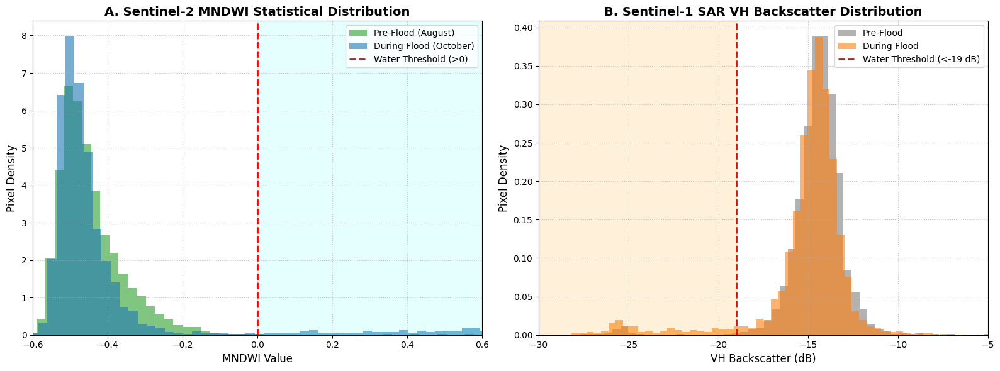

[export] Figure -> /Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/Statistical_Anomaly_Histograms_MNDWI_VH.png


'/Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/Statistical_Anomaly_Histograms_MNDWI_VH.png'

In [22]:
# --- Section 6b: Visualizing the Statistical Anomaly (Histograms) ---

fig, axs = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Sentinel-2 MNDWI Distribution
axs[0].hist(df_s2_stats['MNDWI_Pre'], bins=60, alpha=0.6, label='Pre-Flood (August)', color='#2ca02c', density=True)
axs[0].hist(df_s2_stats['MNDWI_Flood'], bins=60, alpha=0.6, label='During Flood (October)', color='#1f77b4', density=True)

# Add threshold line and annotations
axs[0].axvline(x=0, color='red', linestyle='--', linewidth=2, label='Water Threshold (>0)')
axs[0].set_title('A. Sentinel-2 MNDWI Statistical Distribution', fontsize=14, fontweight='bold')
axs[0].set_xlabel('MNDWI Value', fontsize=12)
axs[0].set_ylabel('Pixel Density', fontsize=12)
axs[0].set_xlim(-0.6, 0.6)
axs[0].legend(loc='upper right')
axs[0].grid(True, linestyle=':', alpha=0.7)

# Highlight the anomaly zone (Right tail)
axs[0].axvspan(0, 0.6, color='cyan', alpha=0.1, label='Flood Anomaly Zone')

# Plot 2: Sentinel-1 SAR VH Distribution
axs[1].hist(df_s1_stats['VH_Pre'], bins=60, alpha=0.6, label='Pre-Flood', color='#7f7f7f', density=True)
axs[1].hist(df_s1_stats['VH_Flood'], bins=60, alpha=0.6, label='During Flood', color='#ff7f0e', density=True)

# Add threshold line and annotations
axs[1].axvline(x=-19, color='red', linestyle='--', linewidth=2, label='Water Threshold (<-19 dB)')
axs[1].set_title('B. Sentinel-1 SAR VH Backscatter Distribution', fontsize=14, fontweight='bold')
axs[1].set_xlabel('VH Backscatter (dB)', fontsize=12)
axs[1].set_ylabel('Pixel Density', fontsize=12)
axs[1].set_xlim(-30, -5)
axs[1].legend(loc='upper right')
axs[1].grid(True, linestyle=':', alpha=0.7)

# Highlight the anomaly zone (Left tail)
axs[1].axvspan(-30, -19, color='orange', alpha=0.15, label='Flood Anomaly Zone')

plt.tight_layout()
plt.show()

save_figure(fig, 'Statistical_Anomaly_Histograms_MNDWI_VH.png')

In [23]:
# --- Section 7a: Multi-Index Extraction and Anomaly Delta Calculation ---

print("Calculating multi-index metrics and extracting sample data for S1 and S2...")

# 1. Compute additional S2 indices
# NDWI (Green vs NIR)
ndwi_pre = pre_flood_img.normalizedDifference(['B3', 'B8']).rename('NDWI_Pre')
ndwi_flood = flood_img.normalizedDifference(['B3', 'B8']).rename('NDWI_Flood')

# NDVI (NIR vs Red)
ndvi_pre = pre_flood_img.normalizedDifference(['B8', 'B4']).rename('NDVI_Pre')
ndvi_flood = flood_img.normalizedDifference(['B8', 'B4']).rename('NDVI_Flood')

# 2. Extract S1 VV band collection alongside VH
s1_vv_collection = ee.ImageCollection('COPERNICUS/S1_GRD') \
    .filterBounds(roi) \
    .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VV')) \
    .filter(ee.Filter.eq('instrumentMode', 'IW')) \
    .select('VV')

s1_vv_pre = s1_vv_collection.filterDate(pre_flood_start, pre_flood_end).median().focal_median(50, 'circle', 'meters').clip(roi).rename('VV_Pre')
s1_vv_flood = s1_vv_collection.filterDate(flood_start, flood_end).median().focal_median(50, 'circle', 'meters').clip(roi).rename('VV_Flood')

# 3. Stack all bands together into two comprehensive multi-band images
s2_multiband = mndwi_pre.rename('MNDWI_Pre').addBands(mndwi_flood.rename('MNDWI_Flood')) \
    .addBands(ndwi_pre).addBands(ndwi_flood) \
    .addBands(ndvi_pre).addBands(ndvi_flood)

s1_multiband = s1_pre_flood.rename('VH_Pre').addBands(s1_flood.rename('VH_Flood')) \
    .addBands(s1_vv_pre).addBands(s1_vv_flood)

# 4. Sample 4,000 pixels securely
s2_sample = s2_multiband.sample(region=roi, scale=100, numPixels=4000, seed=42, geometries=False).getInfo()['features']
s1_sample = s1_multiband.sample(region=roi, scale=100, numPixels=4000, seed=42, geometries=False).getInfo()['features']

# Convert to DataFrames
df_s2_multi = pd.DataFrame([f['properties'] for f in s2_sample]).dropna()
df_s1_multi = pd.DataFrame([f['properties'] for f in s1_sample]).dropna()

# 5. Compute Deltas (Anomaly = Flood minus Pre-Flood)
df_s2_multi['Delta_MNDWI'] = df_s2_multi['MNDWI_Flood'] - df_s2_multi['MNDWI_Pre']
df_s2_multi['Delta_NDWI']  = df_s2_multi['NDWI_Flood'] - df_s2_multi['NDWI_Pre']
df_s2_multi['Delta_NDVI']  = df_s2_multi['NDVI_Flood'] - df_s2_multi['NDVI_Pre']

df_s1_multi['Delta_VH']    = df_s1_multi['VH_Flood'] - df_s1_multi['VH_Pre']
df_s1_multi['Delta_VV']    = df_s1_multi['VV_Flood'] - df_s1_multi['VV_Pre']

print("Data extraction and delta computation successfully completed.")

Calculating multi-index metrics and extracting sample data for S1 and S2...


Data extraction and delta computation successfully completed.


In [24]:
# --- Section 7b: Statistical Summary of Indices and Deltas ---

def summarize_metrics(df, cols, title, filename=None):
    summary = df[cols].describe().T[['mean', 'std', 'min', '50%', 'max']]
    summary.columns = ['Mean', 'Std Dev', 'Min', 'Median (50%)', 'Max']
    summary = summary.round(3)
    print(f"\n--- Statistical Summary: {title} ---")
    display(summary)
    if filename:
        save_table(summary, filename, index=True)
    return summary

# NDWI is included here alongside MNDWI and NDVI: it is computed in Section 7a but,
# unlike the other two, was previously never summarized or plotted anywhere.
s2_index_summary = summarize_metrics(
    df_s2_multi,
    ['MNDWI_Pre', 'MNDWI_Flood', 'Delta_MNDWI', 'NDWI_Pre', 'NDWI_Flood', 'Delta_NDWI', 'NDVI_Pre', 'NDVI_Flood', 'Delta_NDVI'],
    "Sentinel-2 Indices & Deltas (MNDWI, NDWI, NDVI)",
    filename='S2_Indices_And_Deltas_Summary.csv'
)
s1_index_summary = summarize_metrics(
    df_s1_multi,
    ['VH_Pre', 'VH_Flood', 'Delta_VH', 'VV_Pre', 'VV_Flood', 'Delta_VV'],
    "Sentinel-1 Indices & Deltas",
    filename='S1_Indices_And_Deltas_Summary.csv'
)


--- Statistical Summary: Sentinel-2 Indices & Deltas (MNDWI, NDWI, NDVI) ---


,Mean,Std Dev,Min,Median (50%),Max
MNDWI_Pre,-0.427,0.170,-0.615,-0.466,0.846
MNDWI_Flood,-0.369,0.310,-0.609,-0.475,0.835
Delta_MNDWI,0.058,0.276,-0.481,-0.002,1.322
NDWI_Pre,-0.564,0.112,-0.759,-0.587,0.137
NDWI_Flood,-0.496,0.231,-0.722,-0.571,0.429
Delta_NDWI,0.067,0.214,-0.331,0.022,1.064
NDVI_Pre,0.646,0.156,-0.205,0.679,0.877
NDVI_Flood,0.569,0.275,-0.471,0.658,0.863
Delta_NDVI,-0.076,0.254,-1.216,-0.028,0.424


[export] Table  -> /Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/S2_Indices_And_Deltas_Summary.csv

--- Statistical Summary: Sentinel-1 Indices & Deltas ---


,Mean,Std Dev,Min,Median (50%),Max
VH_Pre,-14.528,1.844,-27.672,-14.366,-1.062
VH_Flood,-15.108,2.581,-28.174,-14.603,-3.551
Delta_VH,-0.580,1.949,-14.218,-0.247,3.365
VV_Pre,-7.886,1.915,-22.108,-7.777,3.660
VV_Flood,-8.638,3.029,-24.996,-8.074,2.404
Delta_VV,-0.752,2.181,-15.869,-0.313,4.674


[export] Table  -> /Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/S1_Indices_And_Deltas_Summary.csv


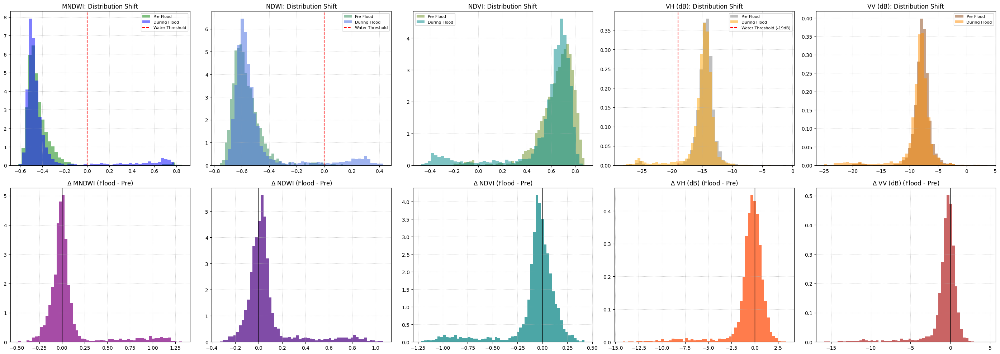

[export] Figure -> /Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/Comprehensive_Index_Distributions_All_Indices.png


'/Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/Comprehensive_Index_Distributions_All_Indices.png'

In [25]:
# --- Section 7c: Comprehensive Plotting of Distributions and Deltas (All 5 Indices, S1 & S2) ---
# Extended to cover every index computed in Section 7a: MNDWI, NDWI, NDVI, VH and VV
# (the original version omitted NDWI entirely and Delta_VV).

fig, axs = plt.subplots(2, 5, figsize=(28, 10))

# (label, source dataframe, pre col, flood col, delta col, pre color, flood color, threshold, threshold label)
index_specs = [
    ('MNDWI',   df_s2_multi, 'MNDWI_Pre', 'MNDWI_Flood', 'Delta_MNDWI', 'green',       'blue',        0,    'Water Threshold'),
    ('NDWI',    df_s2_multi, 'NDWI_Pre',  'NDWI_Flood',  'Delta_NDWI',  'seagreen',    'royalblue',   0,    'Water Threshold'),
    ('NDVI',    df_s2_multi, 'NDVI_Pre',  'NDVI_Flood',  'Delta_NDVI',  'olivedrab',   'darkcyan',    None, None),
    ('VH (dB)', df_s1_multi, 'VH_Pre',    'VH_Flood',    'Delta_VH',    'gray',        'orange',      -19,  'Water Threshold (-19dB)'),
    ('VV (dB)', df_s1_multi, 'VV_Pre',    'VV_Flood',    'Delta_VV',    'saddlebrown', 'darkorange',  None, None),
]

delta_colors = ['purple', 'indigo', 'teal', 'orangered', 'firebrick']

for col_idx, (label, df_src, pre_col, flood_col, delta_col, color_pre, color_flood, threshold, threshold_label) in enumerate(index_specs):
    # Row 0: Pre vs Flood distribution shift
    ax = axs[0, col_idx]
    ax.hist(df_src[pre_col], bins=50, alpha=0.5, label='Pre-Flood', color=color_pre, density=True)
    ax.hist(df_src[flood_col], bins=50, alpha=0.5, label='During Flood', color=color_flood, density=True)
    if threshold is not None:
        ax.axvline(threshold, color='red', linestyle='--', label=threshold_label)
    ax.set_title(f'{label}: Distribution Shift')
    ax.legend(loc='best', fontsize=8)
    ax.grid(True, linestyle=':', alpha=0.6)

    # Row 1: Delta (anomaly) distribution
    ax = axs[1, col_idx]
    ax.hist(df_src[delta_col], bins=60, color=delta_colors[col_idx], alpha=0.7, density=True)
    ax.axvline(0, color='black', linestyle='-', linewidth=1)
    ax.set_title(f'$\\Delta$ {label} (Flood - Pre)')
    ax.grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()
plt.show()

save_figure(fig, 'Comprehensive_Index_Distributions_All_Indices.png')

## 7d. Cross-Index Correlation Analysis

Sections 7a-7c analyze each index independently. Here we ask how the different optical and radar indices *move together* under the same flood anomaly. Sections 7a-7c sampled Sentinel-1 and Sentinel-2 **independently** (two separate `.sample()` calls), so their rows are not guaranteed to be the same pixel locations — valid for comparing each sensor's own distribution, but not for a pixel-to-pixel cross-sensor correlation. To do that validly, this section draws all five indices from a **single combined multi-band image**, sampled once, so every band comes from the exact same pixel locations by construction. Only pixels with valid data across all five indices are kept.

Sampling one combined multi-sensor image so every index shares the same pixel locations...


Pixels with valid data across all 5 indices: 3707

--- Cross-Index Correlation Matrix (Flood-Anomaly Deltas) ---


,Delta_MNDWI,Delta_NDWI,Delta_NDVI,Delta_VH,Delta_VV
Delta_MNDWI,1.000,0.940,-0.913,-0.747,-0.758
Delta_NDWI,0.940,1.000,-0.988,-0.761,-0.773
Delta_NDVI,-0.913,-0.988,1.000,0.756,0.756
Delta_VH,-0.747,-0.761,0.756,1.000,0.874
Delta_VV,-0.758,-0.773,0.756,0.874,1.000


[export] Table  -> /Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/Cross_Index_Correlation_Matrix.csv


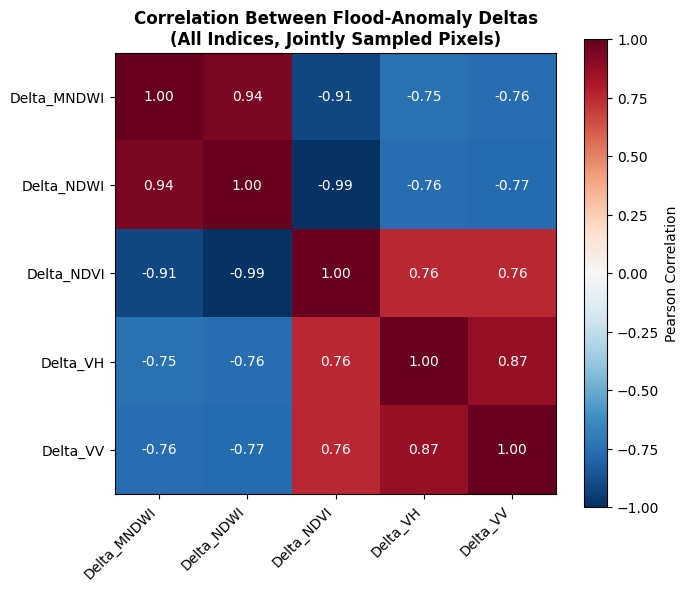

[export] Figure -> /Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/Cross_Index_Correlation_Heatmap.png


'/Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs/Cross_Index_Correlation_Heatmap.png'

In [26]:
# --- Section 7d: Cross-Index Correlation Analysis (all indices, jointly sampled) ---

print("Sampling one combined multi-sensor image so every index shares the same pixel locations...")

combined_multiband = (
    mndwi_pre.rename('MNDWI_Pre').addBands(mndwi_flood.rename('MNDWI_Flood'))
    .addBands(ndwi_pre).addBands(ndwi_flood)
    .addBands(ndvi_pre).addBands(ndvi_flood)
    .addBands(s1_pre_flood.rename('VH_Pre')).addBands(s1_flood.rename('VH_Flood'))
    .addBands(s1_vv_pre).addBands(s1_vv_flood)
)

combined_sample = combined_multiband.sample(
    region=roi, scale=100, numPixels=4000, seed=42, geometries=False
).getInfo()['features']

df_combined = pd.DataFrame([f['properties'] for f in combined_sample]).dropna()

df_combined['Delta_MNDWI'] = df_combined['MNDWI_Flood'] - df_combined['MNDWI_Pre']
df_combined['Delta_NDWI']  = df_combined['NDWI_Flood']  - df_combined['NDWI_Pre']
df_combined['Delta_NDVI']  = df_combined['NDVI_Flood']  - df_combined['NDVI_Pre']
df_combined['Delta_VH']    = df_combined['VH_Flood']    - df_combined['VH_Pre']
df_combined['Delta_VV']    = df_combined['VV_Flood']    - df_combined['VV_Pre']

print(f"Pixels with valid data across all 5 indices: {len(df_combined)}")

delta_cols = ['Delta_MNDWI', 'Delta_NDWI', 'Delta_NDVI', 'Delta_VH', 'Delta_VV']
corr_matrix = df_combined[delta_cols].corr().round(3)

print("\n--- Cross-Index Correlation Matrix (Flood-Anomaly Deltas) ---")
display(corr_matrix)
save_table(corr_matrix, 'Cross_Index_Correlation_Matrix.csv', index=True)

# Heatmap
fig_corr, ax_corr = plt.subplots(figsize=(7, 6))
im = ax_corr.imshow(corr_matrix, cmap='RdBu_r', vmin=-1, vmax=1)
ax_corr.set_xticks(range(len(delta_cols)))
ax_corr.set_yticks(range(len(delta_cols)))
ax_corr.set_xticklabels(delta_cols, rotation=45, ha='right')
ax_corr.set_yticklabels(delta_cols)
for i in range(len(delta_cols)):
    for j in range(len(delta_cols)):
        value = corr_matrix.iloc[i, j]
        ax_corr.text(j, i, f"{value:.2f}", ha='center', va='center',
                     color='white' if abs(value) > 0.5 else 'black', fontsize=10)
ax_corr.set_title('Correlation Between Flood-Anomaly Deltas\n(All Indices, Jointly Sampled Pixels)', fontsize=12, fontweight='bold')
fig_corr.colorbar(im, ax=ax_corr, label='Pearson Correlation')
plt.tight_layout()
plt.show()

save_figure(fig_corr, 'Cross_Index_Correlation_Heatmap.png')

## 8. Summary of Exported Outputs

Verification listing of every figure and table this notebook exports to the shared `outputs` folder.

In [27]:
# --- Verification: list every file this notebook has exported ---
exported_files = sorted(os.listdir(OUT_DIR))
print(f"Contents of {OUT_DIR}:\n")
for fname in exported_files:
    fpath = os.path.join(OUT_DIR, fname)
    size_kb = os.path.getsize(fpath) / 1024
    print(f"  {fname:55s} {size_kb:10.1f} KB")

Contents of /Users/leoshi/Downloads/Ressources/Imperial College/Research Project/Appendix/outputs:

  Comprehensive_Index_Distributions_All_Indices.png            574.7 KB
  Cross_Index_Correlation_Heatmap.png                          223.3 KB
  Cross_Index_Correlation_Matrix.csv                             0.2 KB
  Flood_Comparison_Summary_Lokoja.png                        29040.7 KB
  Flood_Extent_Comparison_Ha.csv                                 0.2 KB
  H1_Observation_Probability_And_S1_Complementarity.png        452.3 KB
  Monthly_Climatology_Clear_Fraction.csv                         0.2 KB
  Monthly_Climatology_Observability.png                        165.6 KB
  Monthly_Exploitable_Observation_Probability.csv                0.3 KB
  S1_Indices_And_Deltas_Summary.csv                              0.3 KB
  S1_SAR_VH_Descriptive_Stats.csv                                0.2 KB
  S2_Indices_And_Deltas_Summary.csv                              0.4 KB
  S2_MNDWI_Descriptive_Stats.csv    